In [2]:
import numpy as np
import pyqg
import matplotlib.pyplot as plt
import sys
sys.path.append('..')
import plot_helpers
from IPython.display import HTML

In [3]:
year = 24*60*60*360.
dt = 3600.
m = pyqg.QGModel(nx=256, dt=dt, tmax=5*year, tavestart=2.5*year, twrite=10000)
m.run()

m2 = pyqg.QGModel(nx=256, dt=dt, tmax=10*year, tavestart=5*year, twrite=10000,
                 rek=7.000000e-08, L=2000000.0,
                 delta=0.10,
                 beta=1.0e-11)
m2.run()

INFO:  Logger initialized
INFO: Step: 10000, Time: 3.60e+07, KE: 1.45e-06, CFL: 0.023
INFO: Step: 20000, Time: 7.20e+07, KE: 2.33e-04, CFL: 0.093
INFO: Step: 30000, Time: 1.08e+08, KE: 6.51e-04, CFL: 0.252
INFO: Step: 40000, Time: 1.44e+08, KE: 6.36e-04, CFL: 0.237
INFO:  Logger initialized
INFO: Step: 10000, Time: 3.60e+07, KE: 2.61e-07, CFL: 0.012
INFO: Step: 20000, Time: 7.20e+07, KE: 2.80e-06, CFL: 0.012
INFO: Step: 30000, Time: 1.08e+08, KE: 5.10e-05, CFL: 0.034
INFO: Step: 40000, Time: 1.44e+08, KE: 1.68e-04, CFL: 0.086
INFO: Step: 50000, Time: 1.80e+08, KE: 1.35e-04, CFL: 0.086
INFO: Step: 60000, Time: 2.16e+08, KE: 1.37e-04, CFL: 0.090
INFO: Step: 70000, Time: 2.52e+08, KE: 1.48e-04, CFL: 0.089
INFO: Step: 80000, Time: 2.88e+08, KE: 1.61e-04, CFL: 0.099


INFO: Step: 50000, Time: 1.80e+08, KE: 5.63e-04, CFL: 0.196


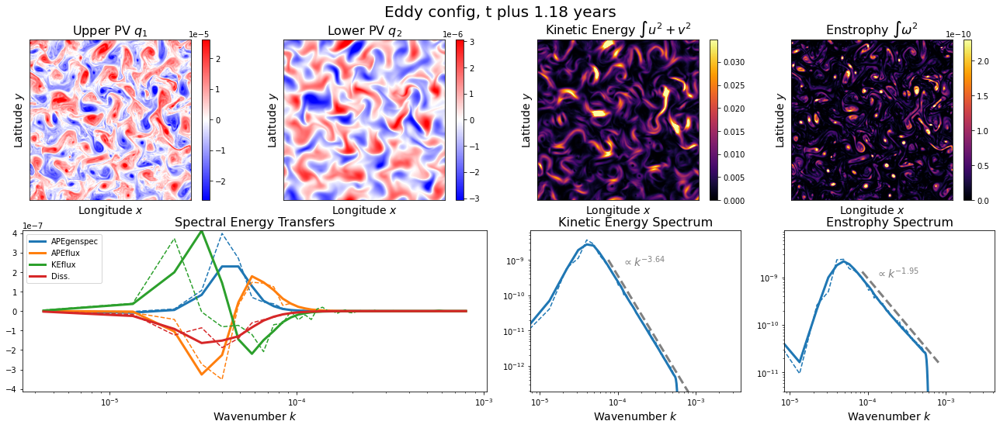

In [4]:
anim = plot_helpers.animate_simulation(m, label="Eddy config")
HTML(anim.to_html5_video())

INFO: Step: 90000, Time: 3.24e+08, KE: 1.55e-04, CFL: 0.087


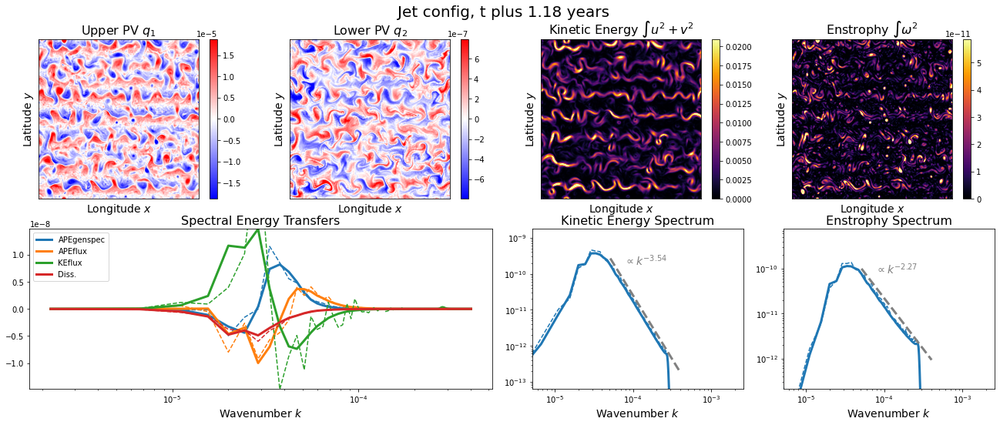

In [5]:
anim2 = plot_helpers.animate_simulation(m2, label="Jet config")
HTML(anim2.to_html5_video())

INFO: Step: 60000, Time: 2.16e+08, KE: 6.31e-04, CFL: 0.229


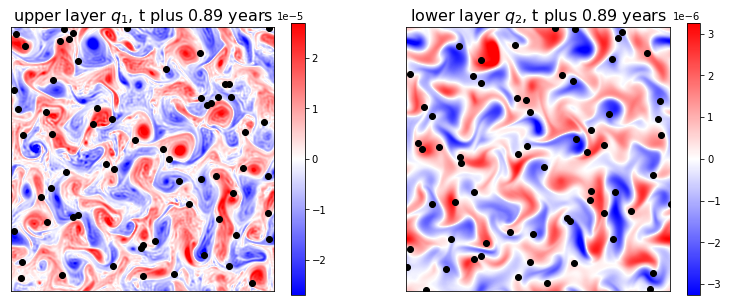

In [5]:
fig = plt.figure(figsize=(13,5))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)

t0 = m.t
mp = plot_helpers.ModelWithParticles(m)
im1 = plot_helpers.AnimatedImage(ax1, lambda: m.q[0])
im2 = plot_helpers.AnimatedImage(ax2, lambda: m.q[1])
sc1 = plot_helpers.AnimatedScatterplot(ax1, lambda: mp.normalized_particle_coords[0], color='black')
sc2 = plot_helpers.AnimatedScatterplot(ax2, lambda: mp.normalized_particle_coords[1], color='black')

anims = [im1, im2, sc1, sc2]

def animate(i):
    for _ in range(75):
        mp._step_forward()
    res = []
    for anim in anims:
        res += anim.animate()
    ax1.set_title(f"upper layer $q_1$, t plus {(m.t-t0)/year:.2f} years", fontsize=16)
    ax2.set_title(f"lower layer $q_2$, t plus {(m.t-t0)/year:.2f} years", fontsize=16)
    return res    
    
anim = animation.FuncAnimation(fig, animate, frames=100, interval=50, blit=True)
HTML(anim.to_html5_video()) 